In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from imblearn.over_sampling import SMOTE
import warnings
warnings.filterwarnings("ignore")


In [2]:
df = pd.read_csv("HR-Employee-Attrition.csv")
df1=df.copy()


In [3]:
df.head(5)
df.shape
df.columns


Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [4]:
df['MaritalStatus'] = df['MaritalStatus'].astype('category')
df['Gender'] = df['Gender'].astype('category')
df['OverTime'] = df['OverTime'].astype('category')
df['BusinessTravel'] = df['BusinessTravel'].astype('category')
df['Attrition'] = df['Attrition'].astype('category')
df['Attrition'] = df['Attrition'].cat.codes
df['MaritalStatus'] = df['MaritalStatus'].cat.codes
df['Gender'] = df['Gender'].cat.codes
df['OverTime'] = df['OverTime'].cat.codes
df['BusinessTravel'] = df['BusinessTravel'].cat.codes



In [5]:
X = df[['Age','OverTime','Gender',
       'DistanceFromHome', 'Education', 'HourlyRate',
       'JobInvolvement', 'JobLevel' ,'JobSatisfaction',
        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
        'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager','MaritalStatus','BusinessTravel']]


In [6]:
Y =  df['Attrition']
class_names = Y.unique()
class_names


array([1, 0], dtype=int8)

([<matplotlib.axis.XTick at 0x79cc2eff3e50>,
 [Text(0, 0, 'No'), Text(1, 0, 'Yes')])

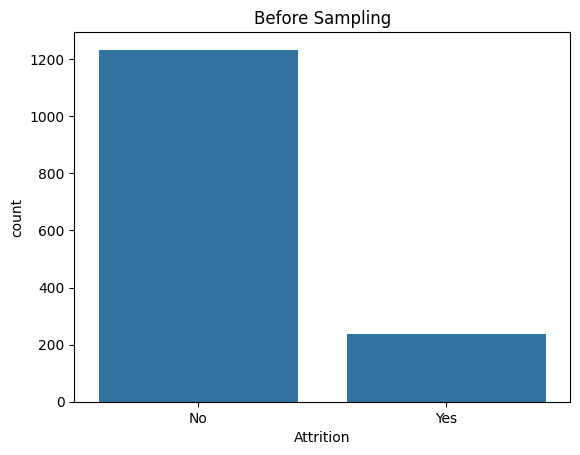

In [7]:
sns.countplot(x=df["Attrition"])
plt.title("Before Sampling")
labels = ['No', 'Yes']
x=[0,1]
plt.xticks(x, labels)


([<matplotlib.axis.XTick at 0x79cc2cc4db70>,
 [Text(0, 0, 'No'), Text(1, 0, 'Yes')])

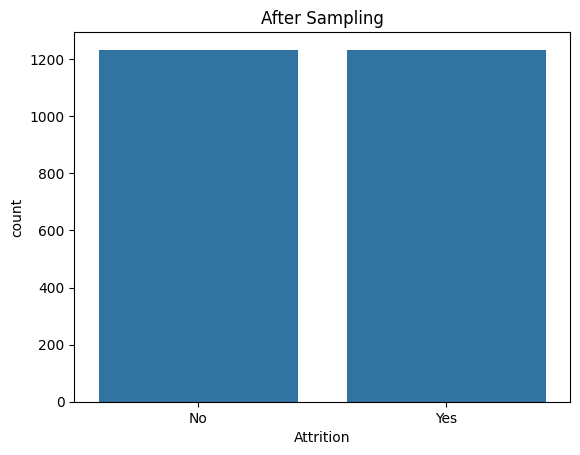

In [8]:
X, Y = SMOTE().fit_resample(X, Y)
sns.countplot(x=Y)
plt.title("After Sampling")
labels = ['No', 'Yes']
x=[0,1]
plt.xticks(x, labels)


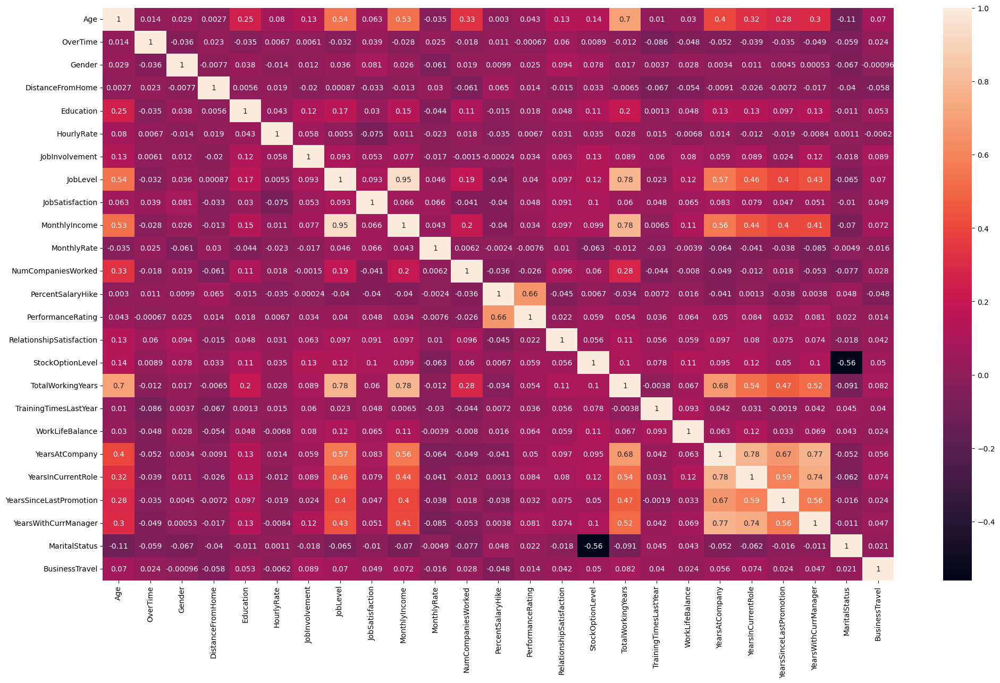

In [9]:
corr = X.corr()
plt.figure(figsize=(24,14))
sns.heatmap(corr, annot=True)
plt.show()


Text(0, 0.5, 'Density')

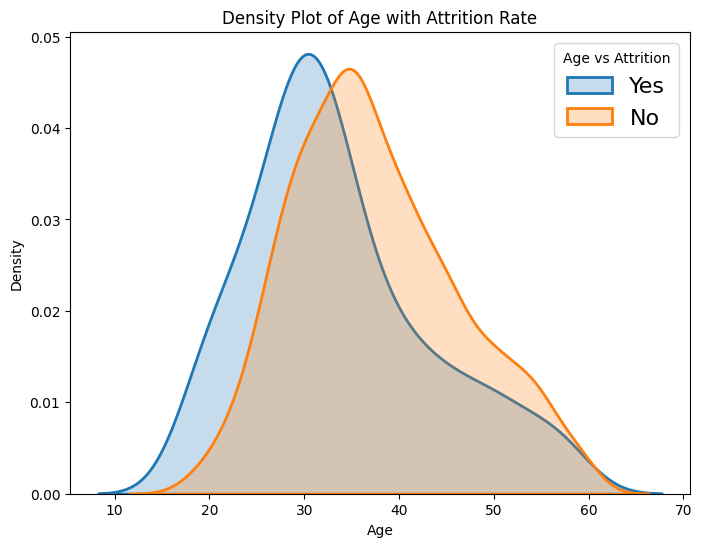

In [10]:
attr = ['Yes', 'No']
plt.figure(figsize=(8,6))

for a in attr:
    # Subset to the airline
    subset = df1[df1['Attrition'] == a]

    # Draw the density plot
    sns.distplot(subset['Age'], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 2},
                  label = a)

plt.legend(prop={'size': 16}, title = 'Age vs Attrition')
plt.title('Density Plot of Age with Attrition Rate')
plt.xlabel('Age')
plt.ylabel('Density')



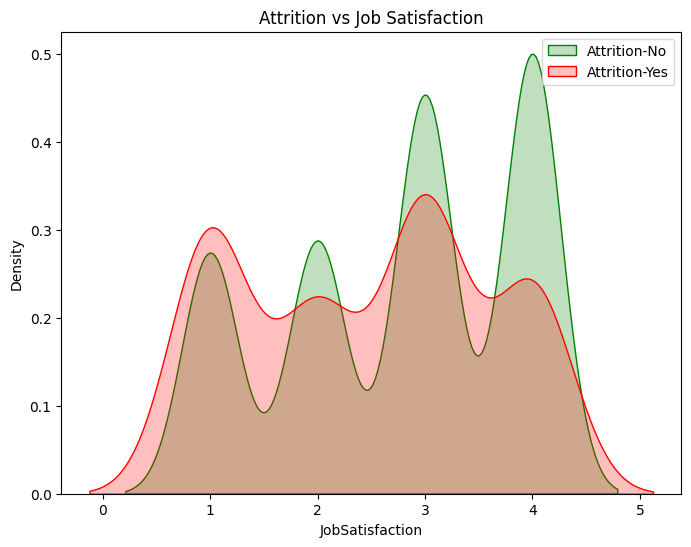

In [11]:
plt.figure(figsize=(8,6))
sns.kdeplot(df.JobSatisfaction[(df['Attrition']==0)], color='green', shade=True)
sns.kdeplot(df.JobSatisfaction[(df['Attrition']==1)], color='red', shade=True)

plt.legend(["Attrition-No","Attrition-Yes"])
plt.title("Attrition vs Job Satisfaction")
plt.show()


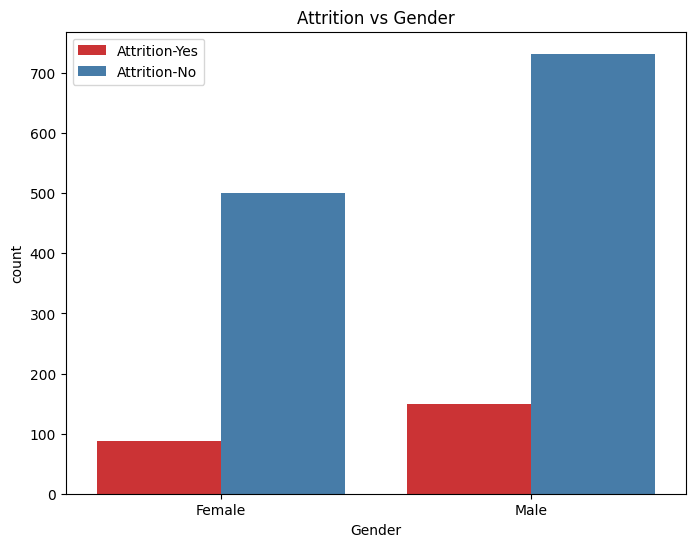

In [12]:
plt.figure(figsize=(8,6))

sns.countplot(x='Gender', hue='Attrition', data=df1,palette="Set1")
plt.legend(["Attrition-Yes","Attrition-No"])
plt.title("Attrition vs Gender")
plt.show()

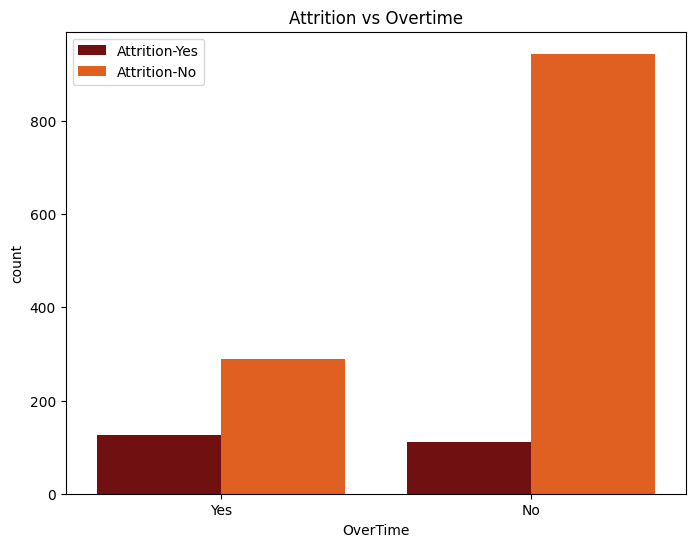

In [13]:
plt.figure(figsize=(8,6))

sns.countplot(x='OverTime', hue='Attrition', data=df1, palette="gist_heat")
plt.legend(["Attrition-Yes","Attrition-No"])
plt.title("Attrition vs Overtime")
plt.show()



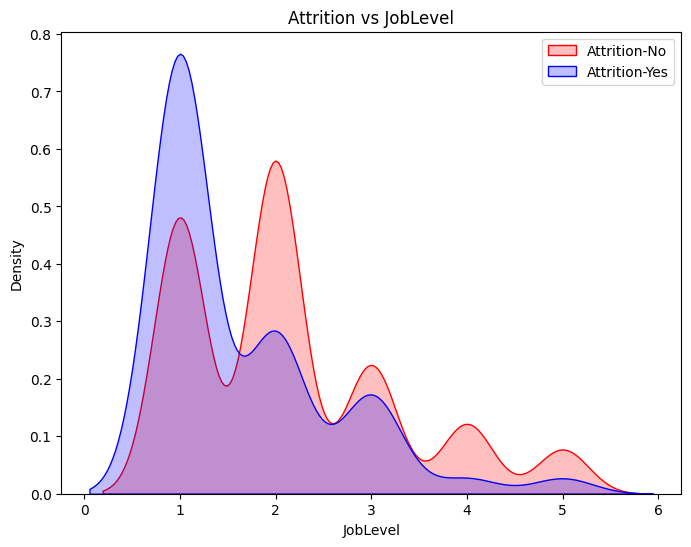

In [14]:
plt.figure(figsize=(8,6))
sns.kdeplot(df.JobLevel[(df['Attrition']==0)], color='Red', shade=True)
sns.kdeplot(df.JobLevel[(df['Attrition']==1)], color='Blue', shade=True)

plt.legend(["Attrition-No","Attrition-Yes"])
plt.title("Attrition vs JobLevel")
plt.show()


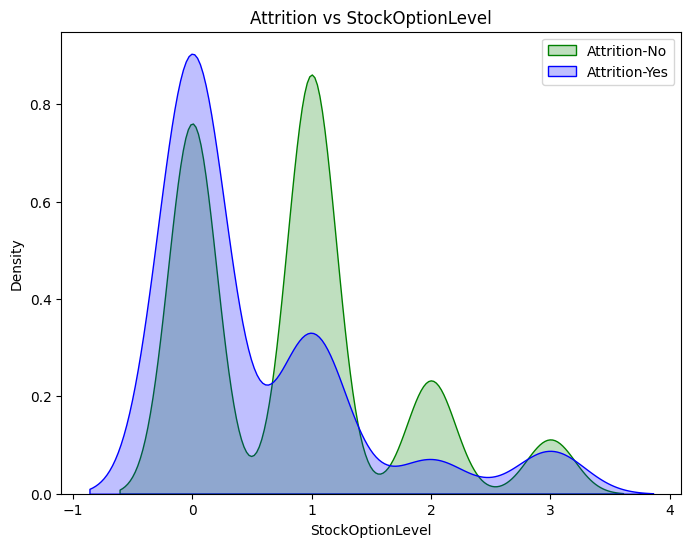

In [15]:
plt.figure(figsize=(8,6))
sns.kdeplot(df.StockOptionLevel[(df['Attrition']==0)], color='Green', shade=True)
sns.kdeplot(df.StockOptionLevel[(df['Attrition']==1)], color='Blue', shade=True)

plt.legend(["Attrition-No","Attrition-Yes"])
plt.title("Attrition vs StockOptionLevel")
plt.show()


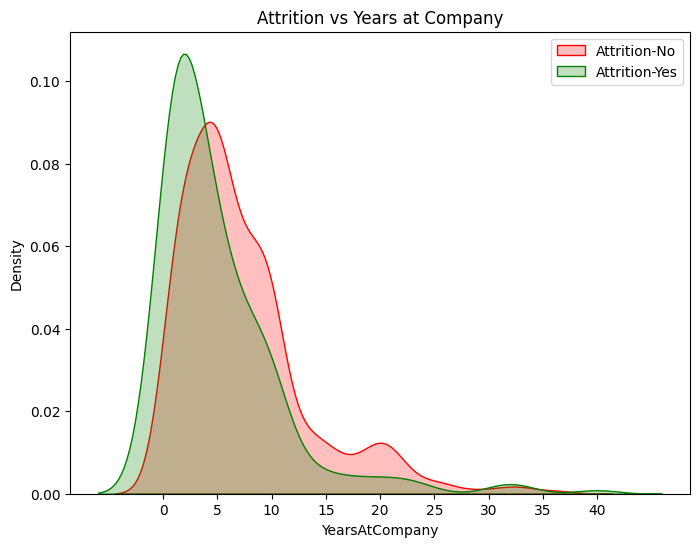

In [16]:
plt.figure(figsize=(8,6))
x_ticks = [0,5,10,15,20,25,30,35,40]
sns.kdeplot(df.YearsAtCompany[(df['Attrition']==0)], color='Red', shade=True)
sns.kdeplot(df.YearsAtCompany[(df['Attrition']==1)], color='Green', shade=True)

plt.legend(["Attrition-No","Attrition-Yes"])
plt.title("Attrition vs Years at Company")
plt.xticks(ticks=x_ticks)
plt.show()


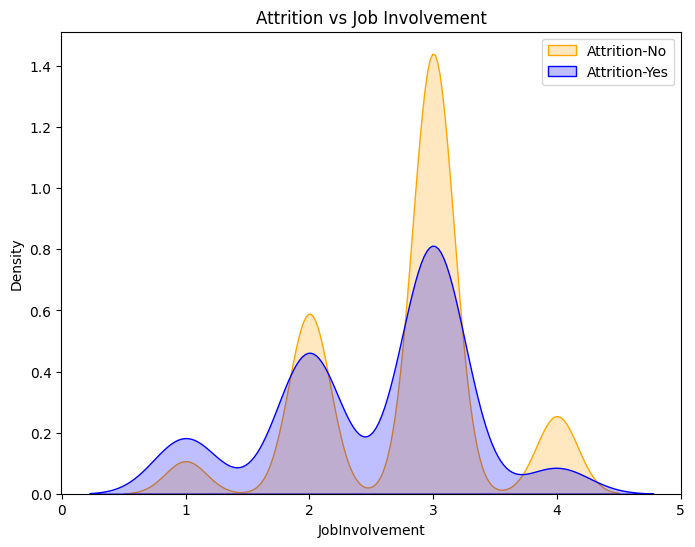

In [17]:
plt.figure(figsize=(8,6))
sns.kdeplot(df.JobInvolvement[(df['Attrition']==0)], color='Orange', shade=True)
sns.kdeplot(df.JobInvolvement[(df['Attrition']==1)], color='Blue', shade=True)

plt.legend(["Attrition-No","Attrition-Yes"])
plt.title("Attrition vs Job Involvement")
plt.show()



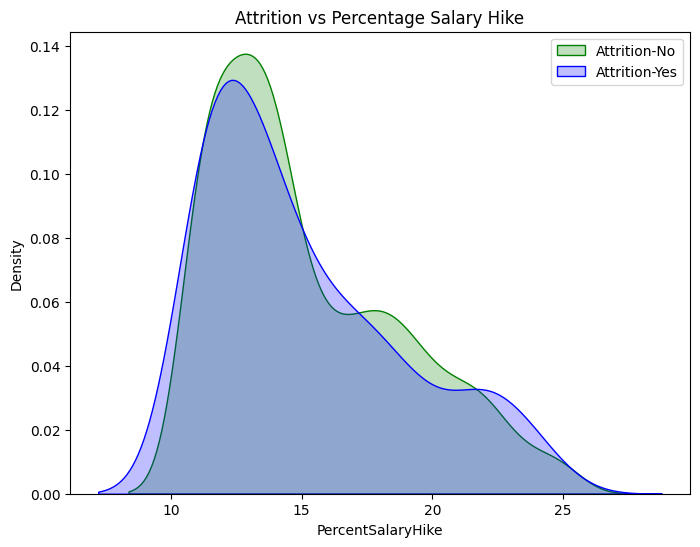

In [18]:
plt.figure(figsize=(8,6))
sns.kdeplot(df.PercentSalaryHike[(df['Attrition']==0)], color='Green', shade=True)
sns.kdeplot(df.PercentSalaryHike[(df['Attrition']==1)], color='Blue', shade=True)

plt.legend(["Attrition-No", "Attrition-Yes"])
plt.title("Attrition vs Percentage Salary Hike")
plt.show()



In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split


In [20]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=.25, random_state = 42)
print("X_Train Shape: ",X_train.shape,"\nX_Test Shape: ",X_test.shape,"\nY_Train Shape: ",Y_train.shape,"\nY_Test Shape: ",Y_test.shape)



X_Train Shape:  (1849, 25) 
X_Test Shape:  (617, 25) 
Y_Train Shape:  (1849,) 
Y_Test Shape:  (617,)


In [21]:
model_logreg = LogisticRegression(random_state = 42, solver='lbfgs',max_iter=500,verbose=5)
model_logreg.fit(X_train,Y_train)
y_pred_lr = model_logreg.predict(X_test)
model_logreg.score(X_train, Y_train)*100
accuracy_score(Y_test, y_pred_lr)*100


71.96110210696921

<Figure size 600x600 with 0 Axes>

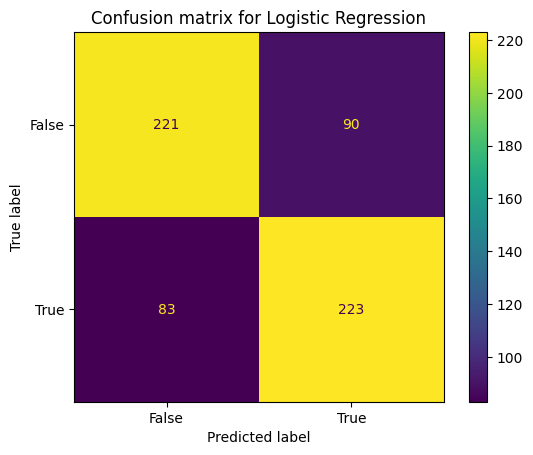

In [22]:
confusion_matrix_lr = confusion_matrix(Y_test, y_pred_lr)
confusion_matrix_lr

plt.figure(figsize=(6,6))

cm_display_lr = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_lr, display_labels = [False, True])
cm_display_lr

cm_display_lr.plot()
plt.title("Confusion matrix for Logistic Regression")

plt.show()



In [23]:
print(classification_report(Y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.73      0.71      0.72       311
           1       0.71      0.73      0.72       306

    accuracy                           0.72       617
   macro avg       0.72      0.72      0.72       617
weighted avg       0.72      0.72      0.72       617



In [24]:
from sklearn.ensemble import RandomForestClassifier

model_rf = RandomForestClassifier(n_estimators=300,oob_score= True,bootstrap=True,max_depth=5,criterion='gini', random_state = 42)
model_rf.fit(X_train,Y_train)
y_pred_rf = model_rf.predict(X_test)
model_rf.score(X_train, Y_train)*100
print("Accuracy: {}".format(accuracy_score(Y_test, y_pred_rf)*100))


Accuracy: 83.79254457050244


Text(0.5, 1.0, 'Most Important features')

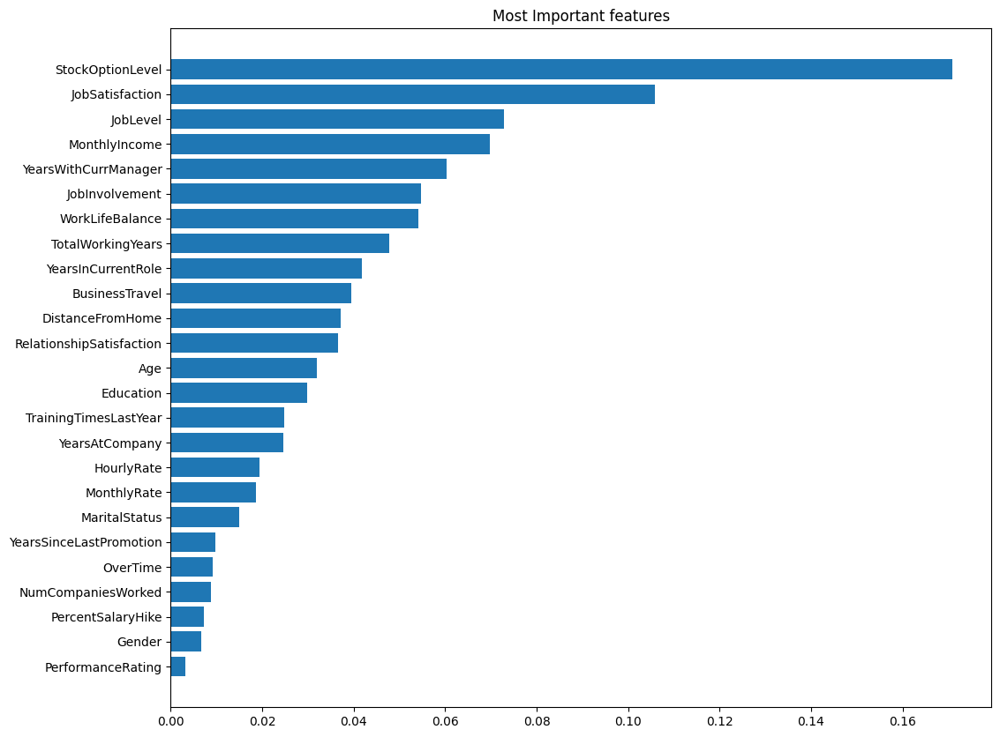

In [25]:
plt.figure(figsize=(12,10))

sort_rf = model_rf.feature_importances_.argsort()
plt.barh(X.columns[sort_rf], model_rf.feature_importances_[sort_rf])
plt.title("Most Important features")



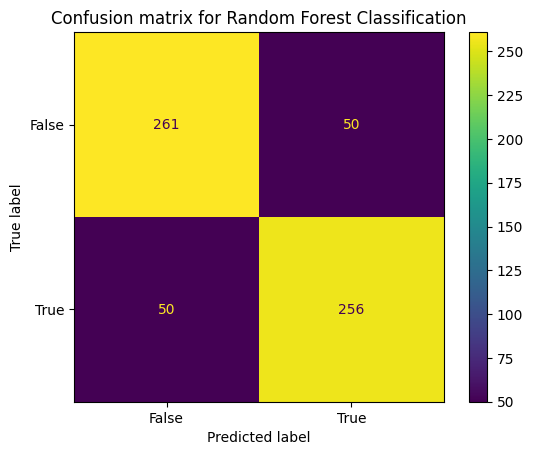

In [26]:
confusion_matrix_rf = confusion_matrix(Y_test, y_pred_rf)
confusion_matrix_rf
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_rf, display_labels = [False, True])
cm_display

cm_display.plot()
plt.title("Confusion matrix for Random Forest Classification")

plt.show()




              precision    recall  f1-score   support

           0       0.84      0.84      0.84       311
           1       0.84      0.84      0.84       306

    accuracy                           0.84       617
   macro avg       0.84      0.84      0.84       617
weighted avg       0.84      0.84      0.84       617



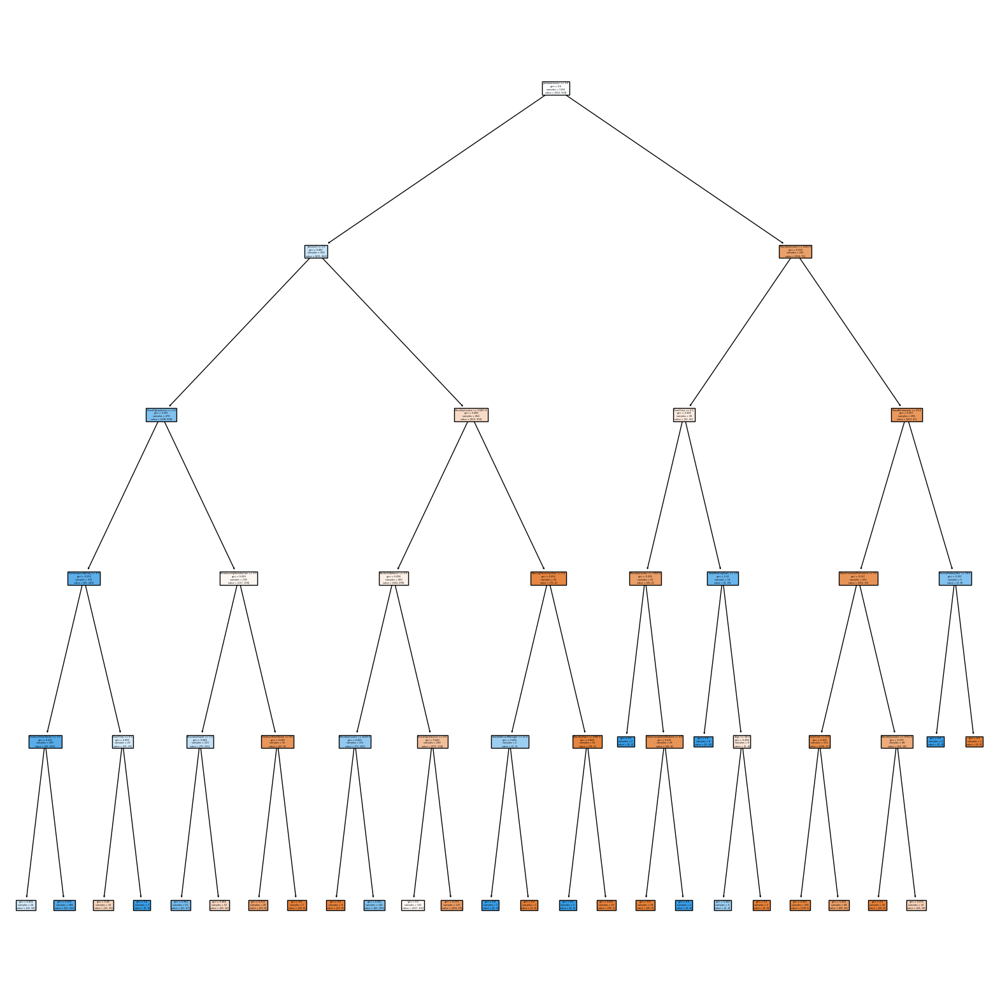

In [27]:
print(classification_report(Y_test, y_pred_rf))

### Plotting Single Decision Tree
from sklearn import tree
len(model_rf.estimators_)
plt.figure(figsize=(20,20))
_ = tree.plot_tree(model_rf.estimators_[0], feature_names=X.columns, filled=True)


In [28]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5,p=1)
np.random.seed(42)
knn.fit(X_train, Y_train)
y_pred_knn = knn.predict(X_test)
knn.score(X_train, Y_train)*100
print("Accuracy: {}".format(accuracy_score(Y_test, y_pred_knn)*100))


Accuracy: 69.69205834683954


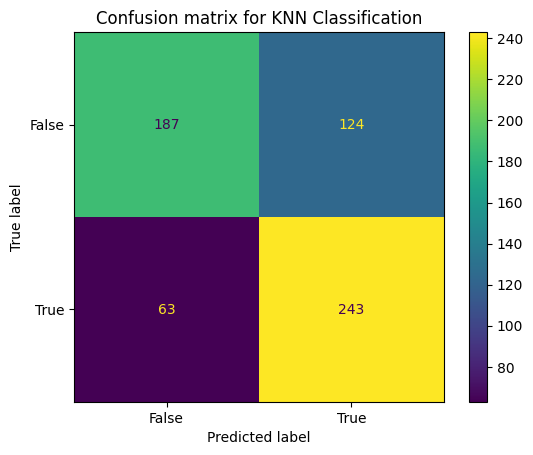

In [29]:
confusion_matrix_knn = confusion_matrix(Y_test, y_pred_knn)
confusion_matrix_knn
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_knn, display_labels = [False, True])
cm_display

cm_display.plot()
plt.title("Confusion matrix for KNN Classification")

plt.show()


In [30]:
print(classification_report(Y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.75      0.60      0.67       311
           1       0.66      0.79      0.72       306

    accuracy                           0.70       617
   macro avg       0.71      0.70      0.69       617
weighted avg       0.71      0.70      0.69       617



In [31]:
from xgboost import XGBClassifier
model_xgb = XGBClassifier(loss='log_loss',base_score=0.9,learning_rate=0.09,colsample_bytree=0.1,max_depth=4,verbose=3, random_state = 42)
model_xgb.fit(X_train.values, Y_train.values)
y_pred_xgb = model_xgb.predict(X_test.values)
model_xgb.score(X_train.values, Y_train.values)*100
accuracy = accuracy_score(Y_test, y_pred_xgb)
accuracy*100


84.27876823338735

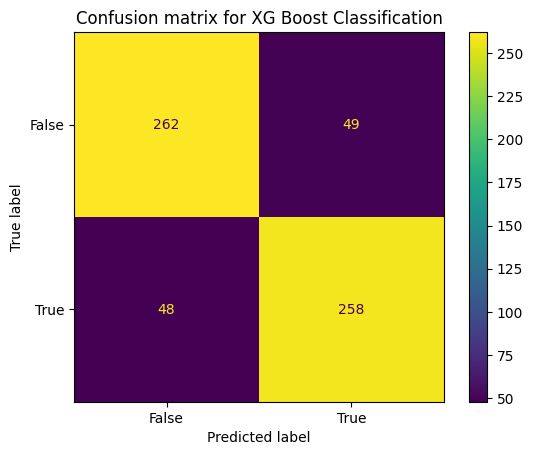

In [32]:
confusion_matrix_xgb = confusion_matrix(Y_test, y_pred_xgb)
confusion_matrix_xgb
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_xgb, display_labels = [False, True])
cm_display

cm_display.plot()
plt.title("Confusion matrix for XG Boost Classification")
plt.show()



In [33]:
print(classification_report(Y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.85      0.84      0.84       311
           1       0.84      0.84      0.84       306

    accuracy                           0.84       617
   macro avg       0.84      0.84      0.84       617
weighted avg       0.84      0.84      0.84       617



<BarContainer object of 25 artists>

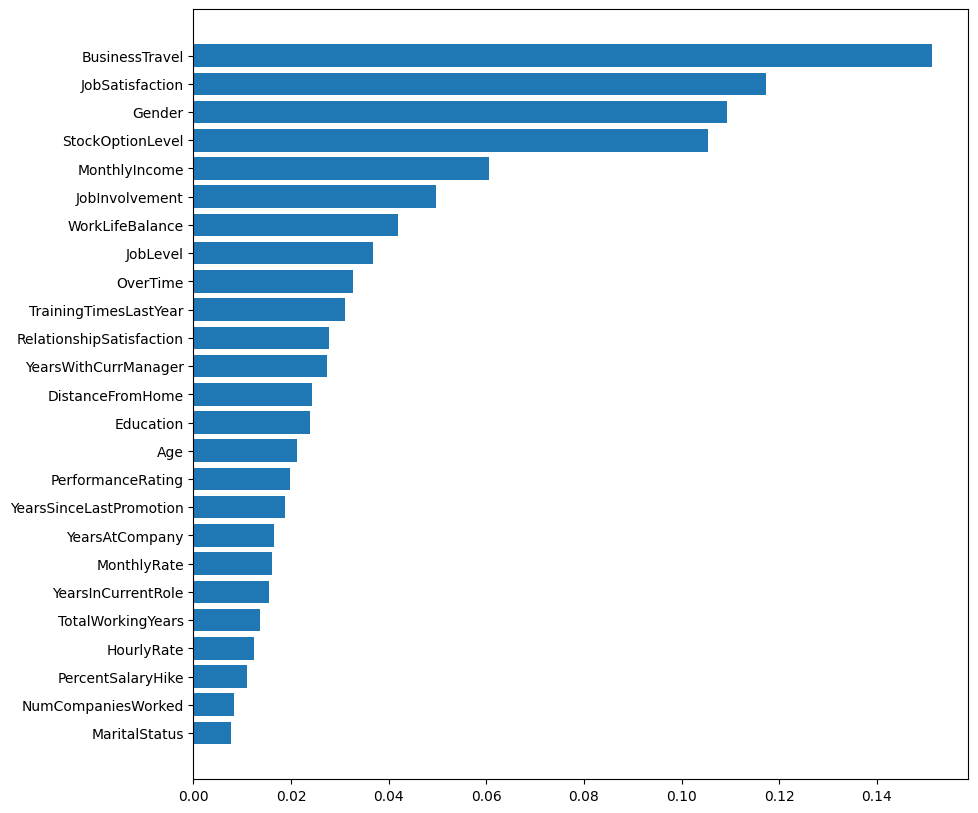

In [34]:
plt.figure(figsize=(10,10))

sort_xgb = model_xgb.feature_importances_.argsort()
plt.barh(X.columns[sort_xgb], model_xgb.feature_importances_[sort_xgb])


<BarContainer object of 25 artists>

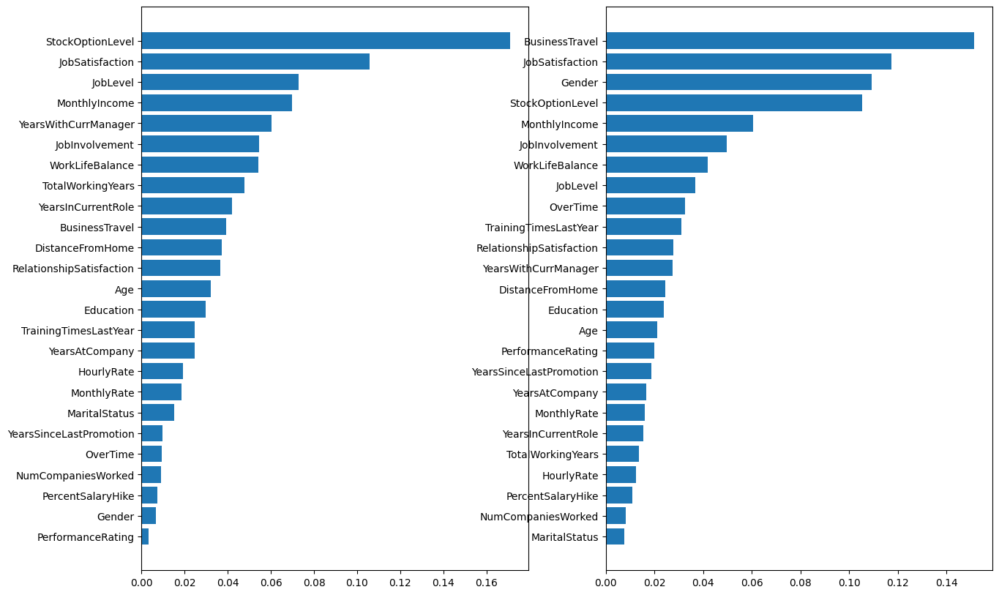

In [35]:
f = plt.figure(figsize=(15,10))

ax = f.add_subplot(1,2,1)
ax = plt.gca()
plt.barh(X.columns[sort_rf], model_rf.feature_importances_[sort_rf])

ax = f.add_subplot(1,2,2)
ax = plt.gca()
plt.barh(X.columns[sort_xgb], model_xgb.feature_importances_[sort_xgb])


In [37]:
# pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=aa6b37e43885b4cfa02bfbacd010ba263314e5fdf6401c41305c5a3a156c0ec5
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [40]:
import lime
import lime.lime_tabular
X.columns


Index(['Age', 'OverTime', 'Gender', 'DistanceFromHome', 'Education',
       'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'MaritalStatus',
       'BusinessTravel'],
      dtype='object')

In [41]:
feature_names = ['Age','OverTime','Gender',
       'DistanceFromHome', 'Education', 'HourlyRate',
       'JobInvolvement', 'JobLevel' ,'JobSatisfaction',
        'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
        'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager','MaritalStatus','BusinessTravel']


In [42]:
print(X_test.iloc[8])
print("\n\n Attrition is: ",Y_test.iloc[8])


Age                           42
OverTime                       0
Gender                         1
DistanceFromHome              13
Education                      3
HourlyRate                    95
JobInvolvement                 4
JobLevel                       2
JobSatisfaction                1
MonthlyIncome               5538
MonthlyRate                 5696
NumCompaniesWorked             5
PercentSalaryHike             18
PerformanceRating              3
RelationshipSatisfaction       3
StockOptionLevel               2
TotalWorkingYears             10
TrainingTimesLastYear          2
WorkLifeBalance                2
YearsAtCompany                 0
YearsInCurrentRole             0
YearsSinceLastPromotion        0
YearsWithCurrManager           0
MaritalStatus                  1
BusinessTravel                 2
Name: 1287, dtype: int64


 Attrition is:  0


In [43]:
Y_test.head(10)

1078    0
1281    1
621     0
1508    1
1975    1
1956    1
1996    1
856     0
1287    0
495     1
Name: Attrition, dtype: int8

In [44]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=feature_names,training_labels=df['Attrition'], mode='classification')



In [45]:
exp_rf1 = explainer.explain_instance(X_test.iloc[8], model_rf.predict_proba, num_features=25)
exp_rf1

###Display Result in Jupiter Notebook
exp_rf1.show_in_notebook(show_table=False, show_all=False)


In [46]:
# pip install shap

In [61]:
import shap
shap.initjs()

In [64]:
explainer_shaprf1 = shap.TreeExplainer(model_rf)
shap_values_shaprf1 = explainer_shaprf1.shap_values(X_test.iloc[8])
shap.initjs()

In [65]:
shap.initjs()
shap.force_plot(explainer_shaprf1.expected_value[0], shap_values_shaprf1[0], X_test.iloc[8])

In [67]:
exp_xgb = explainer.explain_instance(X_test.iloc[8], model_xgb.predict_proba, num_features=25)
exp_xgb.show_in_notebook(show_table=True, show_all=True)


In [68]:
explainer_shapxgb1 = shap.KernelExplainer(model_xgb.predict_proba, X_train)
shap_values_shapxgb1 = explainer_shapxgb1.shap_values(X_test.iloc[8])
shap.force_plot(explainer_shapxgb1.expected_value[0], shap_values_shapxgb1[0], X_test.iloc[8])
shap.initjs()




In [52]:
print(X_test.iloc[3])
print("\n\n Attrition is: ",Y_test.iloc[3])


Age                            42
OverTime                        0
Gender                          1
DistanceFromHome               11
Education                       3
HourlyRate                     72
JobInvolvement                  2
JobLevel                        2
JobSatisfaction                 3
MonthlyIncome                6322
MonthlyRate                 14874
NumCompaniesWorked              5
PercentSalaryHike              12
PerformanceRating               3
RelationshipSatisfaction        2
StockOptionLevel                1
TotalWorkingYears              10
TrainingTimesLastYear           2
WorkLifeBalance                 3
YearsAtCompany                  3
YearsInCurrentRole              1
YearsSinceLastPromotion         0
YearsWithCurrManager            1
MaritalStatus                   0
BusinessTravel                  1
Name: 1508, dtype: int64


 Attrition is:  1


In [53]:
exp_rf2 = explainer.explain_instance(X_test.iloc[3], model_rf.predict_proba, num_features=25)
exp_rf2.show_in_notebook(show_table=True, show_all=True)



In [54]:
explainer_shaprf2 = shap.TreeExplainer(model_rf)
shap_values_shaprf2 = explainer_shaprf2.shap_values(X_test.iloc[3])
shap.force_plot(explainer_shaprf2.expected_value[1], shap_values_shaprf2[1], X_test.iloc[3])

In [55]:
exp_xgb2 = explainer.explain_instance(X_test.iloc[3].values, model_xgb.predict_proba, num_features=25, num_samples=2500)
exp_xgb2.show_in_notebook(show_table=True, show_all=True)


In [56]:
explainer_shapxgb2 = shap.KernelExplainer(model_xgb.predict_proba, X_train)
shap_values_shapxgb2 = explainer_shapxgb2.shap_values(X_test.iloc[3])
shap.force_plot(explainer_shapxgb2.expected_value[1], shap_values_shapxgb2[1], X_test.iloc[3])



In [57]:
l=[]
for n in range(0,X_test.shape[0]):
     exp = explainer.explain_instance(X_test.values[n], model_rf.predict_proba, num_features=20)
     a=exp.predict_proba.tolist()
     l.append(a)
dff = pd.DataFrame(l)
dff1 = np.round(dff,2)

dff1 = dff1.rename(columns={0:"No", 1:"Yes"})
dff1.head(9)


,No,Yes
0,0.84,0.16
1,0.78,0.22
2,0.83,0.17
3,0.48,0.52
4,0.22,0.78
5,0.36,0.64
6,0.19,0.81
7,0.19,0.81
8,0.57,0.43


In [58]:
m=[]
for n in range(0,X_test.shape[0]):
    expshap = explainer_shaprf1.shap_values(X_test.values[n])
    b=np.round(explainer_shaprf1.expected_value[0]+expshap[0].sum(),2).tolist()
    m.append(b)
p=[]
for n in range(0,X_test.shape[0]):
    expshap = explainer_shaprf1.shap_values(X_test.values[n])
    c=np.round(explainer_shaprf1.expected_value[1]+expshap[1].sum(),2).tolist()
    p.append(c)
dff2 = pd.DataFrame({'No': m, 'Yes': p})
dff2.head(9)



,No,Yes
0,0.84,0.16
1,0.78,0.22
2,0.83,0.17
3,0.48,0.52
4,0.22,0.78
5,0.36,0.64
6,0.19,0.81
7,0.19,0.81
8,0.57,0.43


In [59]:
print(dff1.equals(dff2))

True
